In [1]:
import os
import numpy as np
import pandas as pd
import scanpy as sc
import anndata 
import seaborn as sns
from scipy.stats import zscore
from scipy import sparse
import matplotlib.pyplot as plt
import collections
from sklearn.cluster import KMeans
import itertools

from sklearn.decomposition import PCA
from umap import UMAP

from matplotlib.colors import LinearSegmentedColormap

from scroutines.config_plots import *
from scroutines import powerplots # .config_plots import *
from scroutines import pnmf
from scroutines import basicu


/home/qlyu/mambaforge/envs/bbbroutine/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
outdir = "/data/qlyu/v1/results"
outdir_fig = "/data/qlyu/v1/figures"

In [3]:
adata_raw = anndata.read("../../data/cheng21_cell_scrna/reorganized/all_IT.h5ad")
counts = adata_raw.X
allgenes = adata_raw.var.index.values
conds = adata_raw.obs['cond'].values
types = adata_raw.obs['Type'].values
samps = adata_raw.obs['sample'].values

rename_dict = {
    "L2/3_A": "L2/3_A",
    "L2/3_B": "L2/3_B",
    "L2/3_C": "L2/3_C",
    
    "L2/3_1": "L2/3_A",
    "L2/3_2": "L2/3_B",
    "L2/3_3": "L2/3_C",
    
    "L2/3_AB": "L2/3_A",
    "L2/3_BC": "L2/3_C",
    
    "L4_1": "L4_A",
    "L4_2": "L4_B",
}

def rename(x):
    """
    """
    if x in rename_dict.keys():
        return rename_dict[x]
    else:
        return x
    
adata_raw.obs['easitype'] = adata_raw.obs['Type'].apply(rename)
adata_raw.obs['easisamp'] = adata_raw.obs['sample'].apply(lambda x: x.split('_')[-1].replace("3", "2"))
# gi = basicu.get_index_from_array(allgenes, genes)
# assert np.all(gi != -1)
# 

In [4]:
adata_raw.obs

,Class_broad,Doublet,Doublet Score,batch,leiden,n_counts,n_genes,percent_mito,sample,Type,Subclass,cond,easitype,easisamp
AAACCCATCTGCGATA-1-P8_1a-P8,Excitatory,False,0.020833,0,2,10890.0,2716,0.000459,P8_1a,L4_B,L4,P8NR,L4_B,1a
AAAGAACCAGAGTGAC-1-P8_1a-P8,Excitatory,False,0.030303,0,1,11941.0,3446,0.000251,P8_1a,L4_A,L4,P8NR,L4_A,1a
AAAGGATTCCGGTAGC-1-P8_1a-P8,Excitatory,False,0.035673,0,2,14386.0,3872,0.000139,P8_1a,L4_B,L4,P8NR,L4_B,1a
AAAGGGCAGTAGTGCG-1-P8_1a-P8,Excitatory,False,0.049705,0,2,14197.0,4088,0.000211,P8_1a,L4_B,L4,P8NR,L4_B,1a
AAAGGGCTCACGATCA-1-P8_1a-P8,Excitatory,False,0.082031,0,2,12517.0,3569,0.000320,P8_1a,L4_B,L4,P8NR,L4_B,1a
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGGTGGCTAGA-1-P38_dr_2b,NaN,False,0.015884,3,4,7272.0,2789,0.000963,P38_dr_2b,L2/3_2,L2/3,P38DR,L2/3_B,2b
TTTGTTGGTTGCGGCT-1-P38_dr_1a,NaN,False,0.035124,9,2,11411.0,3510,0.000964,P38_dr_1a,L4_2,L4,P38DR,L4_B,1a
TTTGTTGTCGTAACCA-1-P38_dr_2b,NaN,False,0.055689,7,6,9068.0,3100,0.001985,P38_dr_2b,L6IT_A,L6IT,P38DR,L6IT_A,2b
TTTGTTGTCTACTGCC-1-P38_dr_2b,NaN,False,0.031389,9,8,15615.0,4428,0.000640,P38_dr_2b,L4_C,L4,P38DR,L4_C,2b


In [5]:
f = '/data/qlyu/v1/results/P28NR_ITgrad_genes_n749_n338unq_230420.csv'
df2 = pd.read_csv(f)
genes_it = df2['gene'].unique()

In [6]:
# filter genes
# cond = np.ravel((adata_raw.X>0).sum(axis=0)) > 10 # expressed in more than 10 cells
adata_sub = adata_raw[:,genes_it]

# counts
x = adata_sub.X
cov = adata_sub.obs['n_counts'].values
genes = adata_sub.var.index.values

# CP10k
xn = (sparse.diags(1/cov).dot(x))*1e4

# log10(CP10k+1)
xln = xn.copy()
xln.data = np.log10(xln.data+1)

adata_sub.layers['norm'] = xn
adata_sub.layers['lognorm'] = xln

In [7]:
# # adata = adata_sub[:,gsel_idx]
# adata = adata_sub[:,genes_it]

adata = adata_sub
genes_sel = adata.var.index.values
lognorm = np.array(adata.layers['lognorm'].todense())
zlognorm = zscore(lognorm, axis=0)
adata

AnnData object with n_obs × n_vars = 104726 × 338
    obs: 'Class_broad', 'Doublet', 'Doublet Score', 'batch', 'leiden', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'Type', 'Subclass', 'cond', 'easitype', 'easisamp'
    layers: 'norm', 'lognorm'

In [8]:
# # # use those 286 genes
# df = pd.read_csv("../../data/cheng21_cell_scrna/res/L23-ABC-genes-n288-n286unq-annot.csv")
# genes_sel = df['gene'].astype(str).values
# genes_grp = df['P17on'].astype(str).values
# assert np.all(genes_sel == adata.var.index.values)

In [9]:
allcolors = sns.color_palette('tab20c', 20)
allcolors

[(0.19215686274509805, 0.5098039215686274, 0.7411764705882353),
 (0.4196078431372549, 0.6823529411764706, 0.8392156862745098),
 (0.6196078431372549, 0.792156862745098, 0.8823529411764706),
 (0.7764705882352941, 0.8588235294117647, 0.9372549019607843),
 (0.9019607843137255, 0.3333333333333333, 0.050980392156862744),
 (0.9921568627450981, 0.5529411764705883, 0.23529411764705882),
 (0.9921568627450981, 0.6823529411764706, 0.4196078431372549),
 (0.9921568627450981, 0.8156862745098039, 0.6352941176470588),
 (0.19215686274509805, 0.6392156862745098, 0.32941176470588235),
 (0.4549019607843137, 0.7686274509803922, 0.4627450980392157),
 (0.6313725490196078, 0.8509803921568627, 0.6078431372549019),
 (0.7803921568627451, 0.9137254901960784, 0.7529411764705882),
 (0.4588235294117647, 0.4196078431372549, 0.6941176470588235),
 (0.6196078431372549, 0.6039215686274509, 0.7843137254901961),
 (0.7372549019607844, 0.7411764705882353, 0.8627450980392157),
 (0.8549019607843137, 0.8549019607843137, 0.9215686274509803),
 (0.38823529411764707, 0.38823529411764707, 0.38823529411764707),
 (0.5882352941176471, 0.5882352941176471, 0.5882352941176471),
 (0.7411764705882353, 0.7411764705882353, 0.7411764705882353),
 (0.8509803921568627, 0.8509803921568627, 0.8509803921568627)]

In [10]:
allcolors2 = sns.color_palette('tab10', 20)
allcolors2

[(0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 (1.0, 0.4980392156862745, 0.054901960784313725),
 (0.17254901960784313, 0.6274509803921569, 0.17254901960784313),
 (0.8392156862745098, 0.15294117647058825, 0.1568627450980392),
 (0.5803921568627451, 0.403921568627451, 0.7411764705882353),
 (0.5490196078431373, 0.33725490196078434, 0.29411764705882354),
 (0.8901960784313725, 0.4666666666666667, 0.7607843137254902),
 (0.4980392156862745, 0.4980392156862745, 0.4980392156862745),
 (0.7372549019607844, 0.7411764705882353, 0.13333333333333333),
 (0.09019607843137255, 0.7450980392156863, 0.8117647058823529),
 (0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 (1.0, 0.4980392156862745, 0.054901960784313725),
 (0.17254901960784313, 0.6274509803921569, 0.17254901960784313),
 (0.8392156862745098, 0.15294117647058825, 0.1568627450980392),
 (0.5803921568627451, 0.403921568627451, 0.7411764705882353),
 (0.5490196078431373, 0.33725490196078434, 0.29411764705882354),
 (0.8901960784313725, 0.4666666666666667, 0.7607843137254902),
 (0.4980392156862745, 0.4980392156862745, 0.4980392156862745),
 (0.7372549019607844, 0.7411764705882353, 0.13333333333333333),
 (0.09019607843137255, 0.7450980392156863, 0.8117647058823529)]

In [11]:
palette = collections.OrderedDict({
     "P8NR": allcolors[2],
    "P14NR": allcolors[0],
    
    "P17NR": allcolors[7],
    "P21NR": allcolors[6],
    "P28NR": allcolors[5],
    "P38NR": allcolors[4],
    
    "P28DL": allcolors[8],
    
    "P28DR": allcolors[14],
    "P38DR": allcolors[12],
})

cases = np.array(list(palette.keys()))
cases

array(['P8NR', 'P14NR', 'P17NR', 'P21NR', 'P28NR', 'P38NR', 'P28DL',
       'P28DR', 'P38DR'], dtype='<U5')

In [12]:
palette_types = collections.OrderedDict({
    'L2/3_A': allcolors2[0],
    'L2/3_B': allcolors2[1],
    'L2/3_C': allcolors2[2],
    
    'L2/3_1': allcolors2[0],
    'L2/3_2': allcolors2[1],
    'L2/3_3': allcolors2[2],
    
    'L2/3_AB': allcolors2[0],
    'L2/3_BC': allcolors2[2],
})             

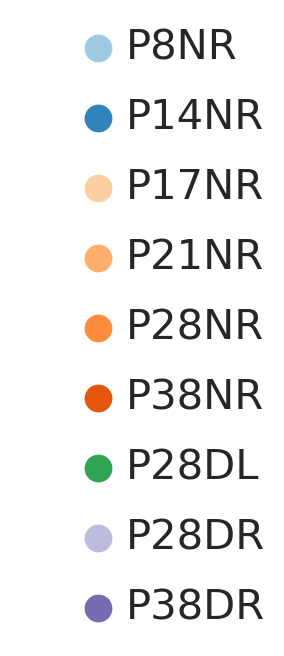

In [13]:
fig, ax = plt.subplots(figsize=(1,4))
for i, (key, item) in enumerate(palette.items()):
    ax.plot(0,     len(palette)-i, 'o', c=item, )
    ax.text(0.02,  len(palette)-i, key, va='center', fontsize=15)
    ax.axis('off')
plt.show()

In [14]:
%%time
pca = PCA(n_components=50)
pcs = pca.fit_transform(zlognorm)
ucs = UMAP(n_components=2, n_neighbors=50).fit_transform(pcs)

# get results
res = pd.DataFrame(pcs, columns=np.char.add("PC", ((1+np.arange(pcs.shape[1])).astype(str))))
res['cond'] = conds
res['type'] = types
res['samp'] = samps
res['umap1'] = ucs[:,0]
res['umap2'] = ucs[:,1]

CPU times: user 49min 31s, sys: 4min 58s, total: 54min 30s
Wall time: 1min 33s


Text(0, 0.5, 'explained var')

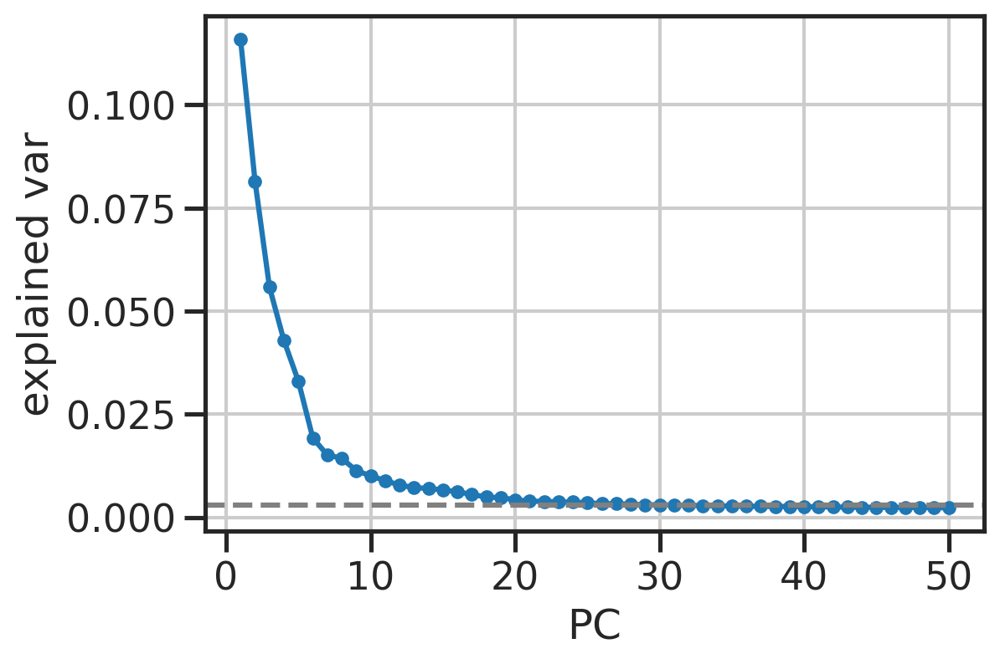

In [15]:
fig, ax = plt.subplots(figsize=(6,4))
ax.plot(np.arange(len(pca.explained_variance_ratio_))+1, pca.explained_variance_ratio_, '-o', markersize=5)
ax.axhline(1/lognorm.shape[1], linestyle='--', color='gray')
ax.set_xlabel('PC')
ax.set_ylabel('explained var')

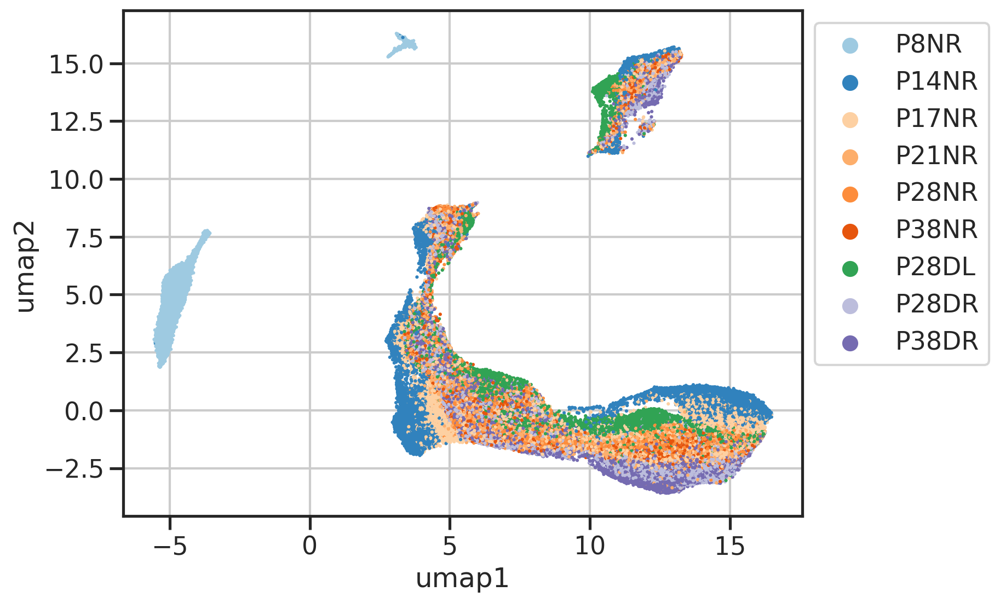

In [16]:
fig, ax = plt.subplots(1,1,figsize=(8*1,6))
sns.scatterplot(data=res.sample(frac=1, replace=False), 
                x='umap1', y='umap2', 
                hue='cond',
                # hue='samp',
                hue_order=list(palette.keys()),
                palette=palette,
                s=5, edgecolor='none', 
                # legend=False,
                ax=ax,
               )
ax.legend(bbox_to_anchor=(1,1))
plt.show()

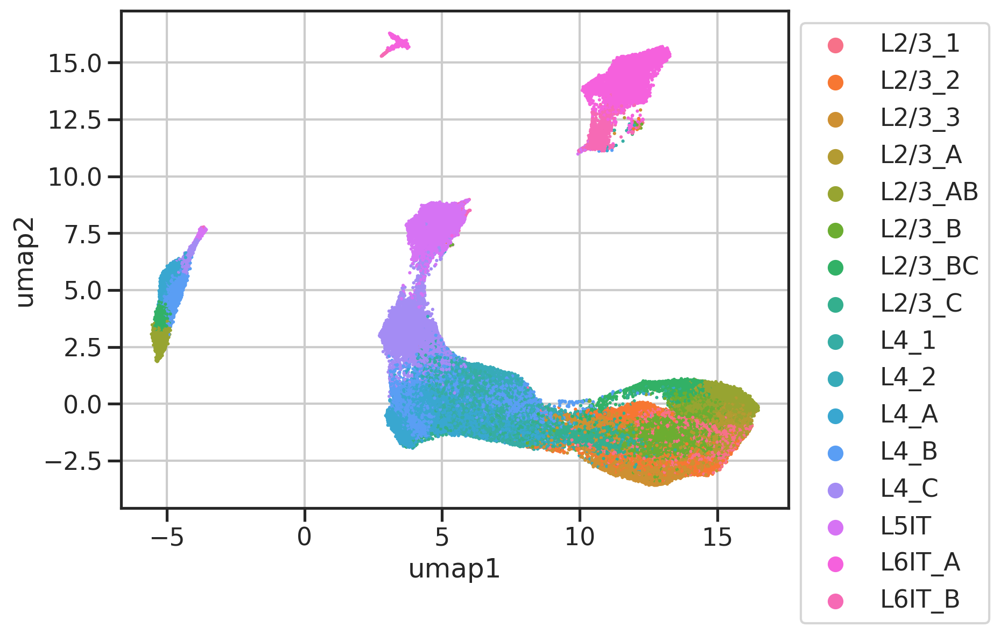

In [17]:
fig, ax = plt.subplots(1,1,figsize=(8*1,6))
sns.scatterplot(data=res.sample(frac=1, replace=False), 
                x='umap1', y='umap2', 
                hue='type',
                # hue='samp',
                # hue_order=list(palette.keys()),
                # palette=palette,
                s=5, edgecolor='none', 
                # legend=False,
                ax=ax,
               )
ax.legend(bbox_to_anchor=(1,1))
plt.show()

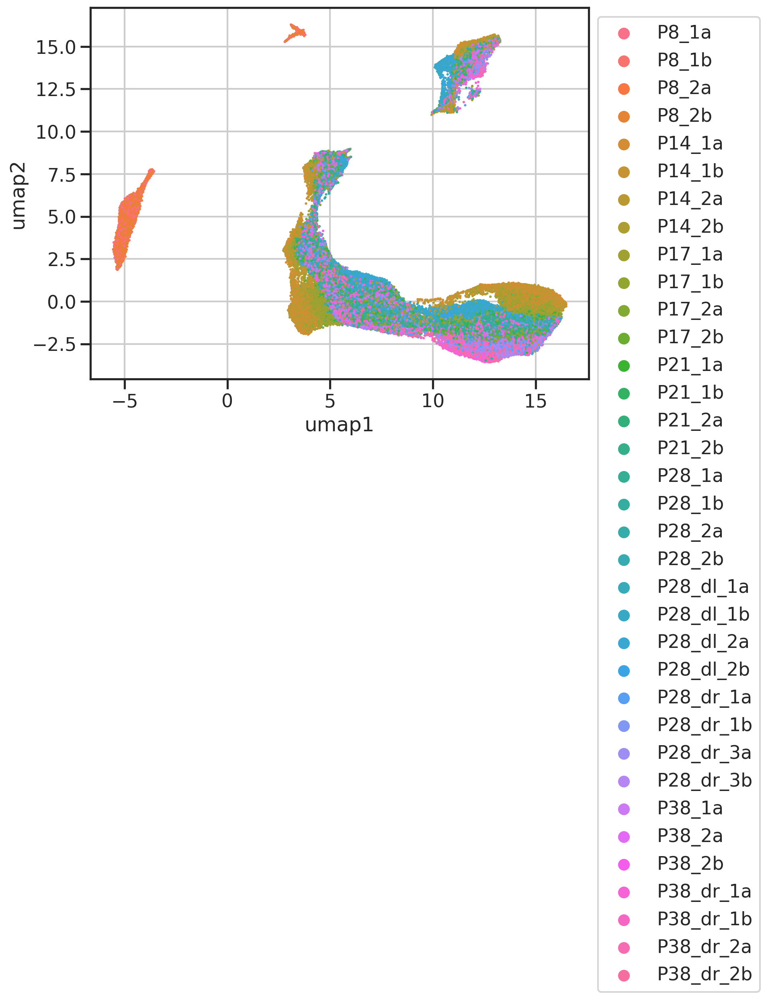

In [18]:
fig, ax = plt.subplots(1,1,figsize=(8*1,6))
sns.scatterplot(data=res.sample(frac=1, replace=False), 
                x='umap1', y='umap2', 
                # hue='type',
                hue='samp',
                # hue_order=list(palette.keys()),
                # palette=palette,
                s=5, edgecolor='none', 
                # legend=False,
                ax=ax,
               )
ax.legend(bbox_to_anchor=(1,1))
plt.show()

In [19]:
def plot_pcs(res, npc, hue, hue_order=None, palette=None):
    fig, axs = plt.subplots(npc-1,npc-1,figsize=(6*(npc-1),5*(npc-1)))
    for i, j in itertools.combinations(range(npc), 2):
        legend = False
        if (i,j) == (0,1): legend=True

        x, y = f"PC{j+1}", f"PC{i+1}"
        ax = axs[i,j-1]

        sns.scatterplot(data=res.sample(frac=1, replace=False), 
                        x=x, y=y, 
                        hue=hue,
                        hue_order=hue_order,
                        palette=palette,
                        # hue_order=list(palette.keys()),
                        # palette=palette,
                        s=5, edgecolor='none', 
                        legend=legend,
                        ax=ax,
                       )
        sns.despine(ax=ax)
    axs[0,0].legend(bbox_to_anchor=(0.5, -0.2), loc='upper center')

    for i, j in itertools.product(range(npc-1), range(npc-1)):
        if j<i:
            ax = axs[i,j]
            ax.axis('off')

    plt.show()

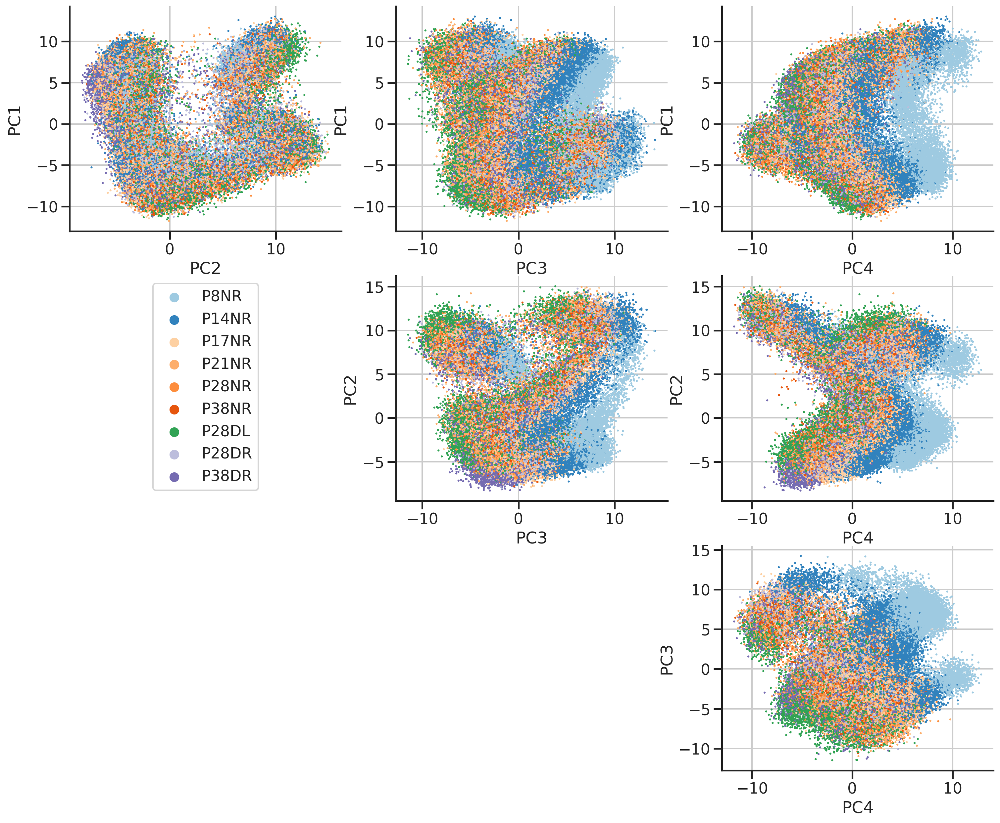

In [20]:
plot_pcs(res, 4, 'cond', hue_order=list(palette.keys()), palette=palette)

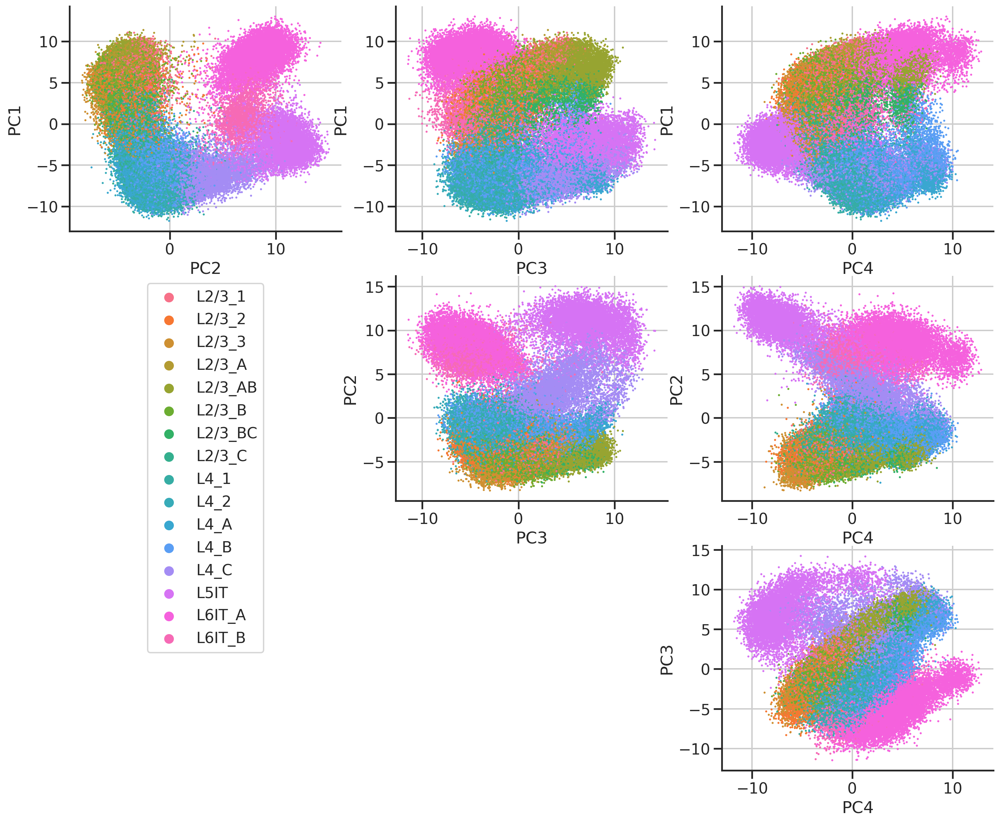

In [21]:
plot_pcs(res, 4, 'type')

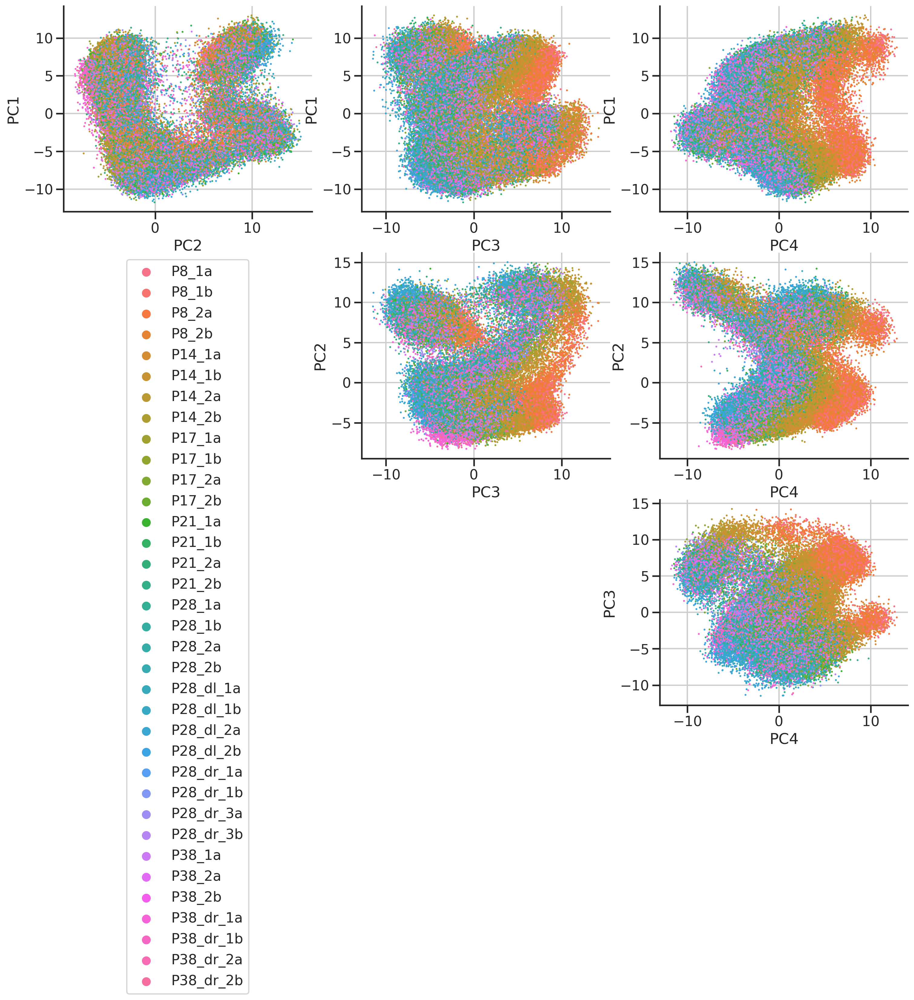

In [22]:
plot_pcs(res, 4, 'samp')

# heatmap

# give each cell a pseudo-time index

In [23]:
choices1 = sns.color_palette('tab10', 9)
choices1

[(0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 (1.0, 0.4980392156862745, 0.054901960784313725),
 (0.17254901960784313, 0.6274509803921569, 0.17254901960784313),
 (0.8392156862745098, 0.15294117647058825, 0.1568627450980392),
 (0.5803921568627451, 0.403921568627451, 0.7411764705882353),
 (0.5490196078431373, 0.33725490196078434, 0.29411764705882354),
 (0.8901960784313725, 0.4666666666666667, 0.7607843137254902),
 (0.4980392156862745, 0.4980392156862745, 0.4980392156862745),
 (0.7372549019607844, 0.7411764705882353, 0.13333333333333333)]

In [24]:
choices2 = sns.color_palette('tab20', 20)
choices2

[(0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 (0.6823529411764706, 0.7803921568627451, 0.9098039215686274),
 (1.0, 0.4980392156862745, 0.054901960784313725),
 (1.0, 0.7333333333333333, 0.47058823529411764),
 (0.17254901960784313, 0.6274509803921569, 0.17254901960784313),
 (0.596078431372549, 0.8745098039215686, 0.5411764705882353),
 (0.8392156862745098, 0.15294117647058825, 0.1568627450980392),
 (1.0, 0.596078431372549, 0.5882352941176471),
 (0.5803921568627451, 0.403921568627451, 0.7411764705882353),
 (0.7725490196078432, 0.6901960784313725, 0.8352941176470589),
 (0.5490196078431373, 0.33725490196078434, 0.29411764705882354),
 (0.7686274509803922, 0.611764705882353, 0.5803921568627451),
 (0.8901960784313725, 0.4666666666666667, 0.7607843137254902),
 (0.9686274509803922, 0.7137254901960784, 0.8235294117647058),
 (0.4980392156862745, 0.4980392156862745, 0.4980392156862745),
 (0.7803921568627451, 0.7803921568627451, 0.7803921568627451),
 (0.7372549019607844, 0.7411764705882353, 0.13333333333333333),
 (0.8588235294117647, 0.8588235294117647, 0.5529411764705883),
 (0.09019607843137255, 0.7450980392156863, 0.8117647058823529),
 (0.6196078431372549, 0.8549019607843137, 0.8980392156862745)]

In [25]:
my_colors = tuple(list(choices1)) #('C0', 'C1', 'C2')
cmap_d1 = LinearSegmentedColormap.from_list('', my_colors, len(my_colors))

my_colors = tuple(list(choices2[6:8])+list(choices2[14:16]))
cmap_d2 = LinearSegmentedColormap.from_list('', my_colors, len(my_colors))

ncell, ngene = zlognorm.shape

In [26]:
# Use P28 ordering
f = '../../results/P28NR_geneptime_Apr24.csv'
dfgpt = pd.read_csv(f, index_col=0)
assert np.all(adata.var.index.values == dfgpt.index.values)

gpt = dfgpt['ptime_l23'].values
geneidx = np.argsort(gpt)
dfgpt

,ptime_l23,ptime_l4,ptime_l56
Kcnq5,0.078856,0.222606,0.695823
Rims1,0.077807,0.223217,0.695342
Col19a1,0.078534,0.203949,0.693794
Pam,0.068713,0.222543,0.755499
Cntnap5a,0.069253,0.256070,0.600009
...,...,...,...
AC149090.1,0.073119,0.225052,0.703664
Ntng1,0.088997,0.232805,0.800567
Slc24a2,0.074881,0.225441,0.707347
RF01962,0.089044,0.227297,0.823495


In [27]:
# Use ptime from each sample analysis
dfall = []
for case in cases:
    f = f'../../results/{case}_cellptime_Apr24.csv'
    df = pd.read_csv(f, index_col=0)
    df['case'] = case
    dfall.append(df)
dfall = pd.concat(dfall)
dfall['ptime'] = dfall['dpt_pseudotime']
assert np.all(dfall.index.values == adata.obs.index.values)
dfall

,dpt_pseudotime,case,ptime
AAACCCATCTGCGATA-1-P8_1a-P8,0.072726,P8NR,0.072726
AAAGAACCAGAGTGAC-1-P8_1a-P8,0.079355,P8NR,0.079355
AAAGGATTCCGGTAGC-1-P8_1a-P8,0.087240,P8NR,0.087240
AAAGGGCAGTAGTGCG-1-P8_1a-P8,0.077683,P8NR,0.077683
AAAGGGCTCACGATCA-1-P8_1a-P8,0.079283,P8NR,0.079283
...,...,...,...
TTTGTTGGTGGCTAGA-1-P38_dr_2b,0.093848,P38DR,0.093848
TTTGTTGGTTGCGGCT-1-P38_dr_1a,0.350293,P38DR,0.350293
TTTGTTGTCGTAACCA-1-P38_dr_2b,0.886026,P38DR,0.886026
TTTGTTGTCTACTGCC-1-P38_dr_2b,0.557373,P38DR,0.557373


In [28]:
def plot(zlognorm, cellidx, geneidx, types, genes_grp, case,
         vmax=3, vmin=-3, vcenter=0,
         figsize=(12,6), xticklabels=1000, yticklabels=100, hratio=20, vratio=10):
    """
    """
    mosaic = ("B"+"A"*hratio+"\n")*vratio + "."+"C"*hratio
    # print(mosaic)
    fig, axdict = plt.subplot_mosaic(mosaic, figsize=figsize)
    fig.suptitle(case)
    ax = axdict['A']
    sns.heatmap(zlognorm[cellidx][:,geneidx].T,
                xticklabels=False,
                yticklabels=False,
                cbar_kws=dict(shrink=0.3, label='zscore log10CP10k', aspect=10),
                center=vcenter,
                vmax=vmax,
                vmin=vmin,
                cmap='coolwarm',
                rasterized=True,
                ax=ax,
               )
    
    ax = axdict['B']
    sns.heatmap(pd.factorize(genes_grp[geneidx], sort=True)[0].reshape(-1,1), 
                xticklabels=False,
                yticklabels=yticklabels,
                cmap=cmap_d1,
                cbar=False,
                rasterized=True,
                ax=ax, 
               )
    ax.set_ylabel('Genes')
    ax.set_yticklabels(ax.get_yticklabels(), rotation=0, fontsize=10)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=0, fontsize=10)

    ax = axdict['C']
    sns.heatmap(pd.factorize(types[cellidx], sort=True)[0].reshape(-1,1).T, 
                xticklabels=xticklabels,
                yticklabels=False,
                cmap=cmap_d1,
                cbar_kws=dict(ticks=[0,1,2], shrink=2, aspect=5),
                rasterized=True,
                ax=ax, 
               )
    ax.set_xlabel('Cells')
    fig.axes[-1].set_yticklabels(['A','B','C'])
    ax.set_yticklabels(ax.get_yticklabels(), rotation=0, fontsize=10)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=0, fontsize=10)

    fig.subplots_adjust(hspace=0.4)
    return fig, axdict
    # fig.suptitle(sample)
    # powerplots.savefig_autodate(fig, os.path.join(outdir_fig, f'heatmap_{sample}_v3.pdf'))
    # plt.show()

In [29]:
def plot2(zlognorm, cellidx, geneidx, types, genes_grp, case, samps,
         vmax=3, vmin=-3, vcenter=0,
         figsize=(12,6), xticklabels=1000, yticklabels=100, hratio=20, vratio=10):
    """
    """
    mosaic = ("B"+"A"*hratio+"\n")*vratio + ("."+"C"*hratio+"\n") + ("."+"D"*hratio+"\n")
    # print(mosaic)
    fig, axdict = plt.subplot_mosaic(mosaic, figsize=figsize)
    fig.suptitle(case)
    ax = axdict['A']
    sns.heatmap(zlognorm[cellidx][:,geneidx].T,
                xticklabels=False,
                yticklabels=False,
                cbar_kws=dict(shrink=0.3, label='zscore log10CP10k', aspect=10),
                center=vcenter,
                vmax=vmax,
                vmin=vmin,
                cmap='coolwarm',
                rasterized=True,
                ax=ax,
               )
    
    ax = axdict['B']
    sns.heatmap(pd.factorize(genes_grp[geneidx], sort=True)[0].reshape(-1,1), 
                xticklabels=False,
                yticklabels=yticklabels,
                cmap=cmap_d1,
                cbar=False,
                rasterized=True,
                ax=ax, 
               )
    ax.set_ylabel('Genes')
    ax.set_yticklabels(ax.get_yticklabels(), rotation=0, fontsize=10)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=0, fontsize=10)
    
    ax = axdict['C']
    sns.heatmap(pd.factorize(types[cellidx], sort=True)[0].reshape(-1,1).T, 
                xticklabels=False,
                yticklabels=False,
                cmap=cmap_d1,
                cbar_kws=dict(shrink=1.2, aspect=3, label='type'),
                rasterized=True,
                ax=ax, 
               )
    # fig.axes[-1].set_yticklabels(['A','B','C'], fontsize=10)
    fig.axes[-1].set_ylabel(fig.axes[-1].get_ylabel(), rotation=0, ha='left')

    ax = axdict['D']
    sns.heatmap(pd.factorize(samps[cellidx], sort=True)[0].reshape(-1,1).T, 
                xticklabels=xticklabels,
                yticklabels=False,
                cmap=cmap_d2,
                cbar_kws=dict(ticks=[], shrink=1.2, aspect=3, label='sample'),
                rasterized=True,
                ax=ax, 
               )
    ax.set_xlabel('Cells')
    fig.axes[-1].set_ylabel(fig.axes[-1].get_ylabel(), rotation=0, ha='left')
    ax.set_yticklabels(ax.get_yticklabels(), rotation=0, fontsize=10)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=0, fontsize=10)

    fig.subplots_adjust(hspace=0.4)
    return fig, axdict
    # fig.suptitle(sample)
    # powerplots.savefig_autodate(fig, os.path.join(outdir_fig, f'heatmap_{sample}_v3.pdf'))
    # plt.show()

In [30]:
# a big table of everything
allcells = adata.obs.index.values
bigmat = []
bigtypes = []

ncases = []
for case in cases:
    # select cells
    adata_sub = adata[adata.obs['cond']==case]
    cells_sub = adata_sub.obs.index.values
    cellsidx_sub = basicu.get_index_from_array(allcells, cells_sub)
    
    dfall_sub = dfall.loc[cells_sub]
    zlognorm_sub = zlognorm[cellsidx_sub]
    
    # order cells
    cellidx = np.argsort(dfall_sub['ptime'].values)
    _types   = adata_sub.obs['easitype'].values
    
    bigmat.append(zlognorm_sub[cellidx])
    bigtypes.append(_types[cellidx])
    ncases.append(len(cellidx))
    
bigmat = np.vstack(bigmat)
bigtypes = np.hstack(bigtypes)
bigmat.shape

(104726, 338)

In [31]:
print(np.percentile(bigmat, [0,5,95,100]))
# sns.boxplot(np.ravel(bigmat))

[-14.10580254  -1.40977073   1.67525355  12.52400208]


[-14.10580254  -1.40977073   1.67525355  12.52400208]


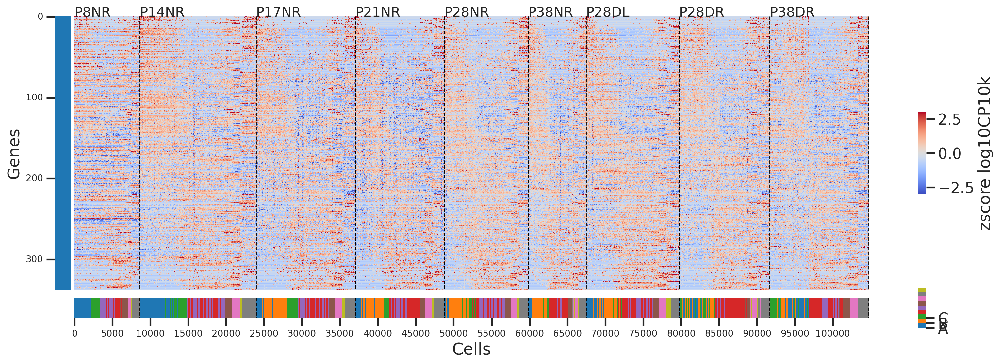

In [32]:
print(np.percentile(bigmat, [0,5,95,100]))

fig, axdict = plot(bigmat, np.arange(len(bigmat)), geneidx, bigtypes, np.repeat('A',len(geneidx)), "",
                   figsize=(20,6), xticklabels=5000, hratio=50)
axdict['A'].vlines(np.cumsum(ncases), 0, bigmat.shape[1], color='k', linestyle='--', linewidth=1)
axdict['C'].vlines(np.cumsum(ncases), 0, 1, color='k', linestyle='--', linewidth=1)
for x, case in zip(np.hstack([[0], np.cumsum(ncases)]), cases):
    axdict['A'].text(x, 0, case, fontsize=15)
plt.show()

# Ephs and Ephrins

In [33]:
adata

AnnData object with n_obs × n_vars = 104726 × 338
    obs: 'Class_broad', 'Doublet', 'Doublet Score', 'batch', 'leiden', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'Type', 'Subclass', 'cond', 'easitype', 'easisamp'
    layers: 'norm', 'lognorm'

In [34]:
adata_raw

AnnData object with n_obs × n_vars = 104726 × 53801
    obs: 'Class_broad', 'Doublet', 'Doublet Score', 'batch', 'leiden', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'Type', 'Subclass', 'cond', 'easitype', 'easisamp'

In [35]:
genes_new = [
    'Cdh13', 
    'Adamts2', 
    
    # 'Trpc6', 
    # 'Baz1a', 
    
    'Chrm2', 
    'Grik3', 
    
    # ephs
    'Epha1', 'Epha2', 'Epha3', 'Epha4', 'Epha5', 'Epha6', 'Epha7', 'Epha8', 'Epha10', 
    'Ephb1', 'Ephb2', 'Ephb3', 'Ephb4', 'Ephb6',
    
    # ephrins
    'Efna1', 'Efna2', 'Efna3', 'Efna4', 'Efna5', 
    'Efnb1', 'Efnb2', 'Efnb3',
    
#     'Nr4a2', 'Nr4a3', 'Fos', 'Arl5b', 
#     'Col19a1', 'Scube1', 'Ptchd4', 'Nell1',
    ]
gi2 = basicu.get_index_from_array(allgenes, genes_new)
assert np.all(gi2 != -1)

In [36]:
# a big table of everything
allcells = adata.obs.index.values
bigmat = []
bigtypes = []
bigsamps = []
ncases = []
for case in cases:
    # select cells
    adata_sub = adata[adata.obs['cond']==case]
    cells_sub = adata_sub.obs.index.values
    cellsidx_sub = basicu.get_index_from_array(allcells, cells_sub)
    
    dfall_sub = dfall.loc[cells_sub]
    
    ftrs_sub  = adata_raw[cells_sub].X
    cov = np.ravel(ftrs_sub.sum(axis=1))
    ftrs_sub  = np.log10(np.asarray(ftrs_sub[:,gi2].todense())/cov.reshape(-1,1)*1e4+1)
    
    # order cells
    _types   = adata_sub.obs['easitype'].values
    _samps   = adata_sub.obs['easisamp'].values
    cellidx = np.argsort(dfall_sub['ptime'].values)
    
    bigmat.append(ftrs_sub[cellidx])
    bigtypes.append(_types[cellidx])
    bigsamps.append(_samps[cellidx])
    ncases.append(len(cellidx))
    
bigmat = np.vstack(bigmat)
bigmat = zscore(bigmat, axis=0)
bigtypes = np.hstack(bigtypes)
bigsamps = np.hstack(bigsamps)
bigmat.shape

(104726, 26)

[-2.72200751 -0.9210754   1.74113742 68.646698  ]


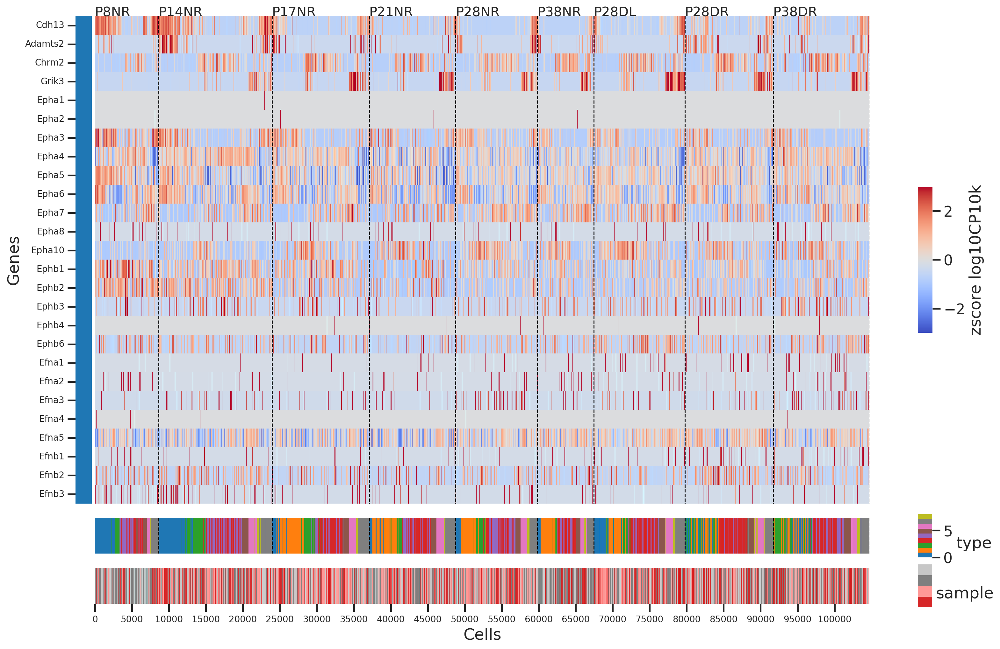

In [37]:
print(np.percentile(bigmat, [0,5,95,100]))

fig, axdict = plot2(bigmat, np.arange(len(bigmat)), np.arange(bigmat.shape[1]), bigtypes, 
                    np.array(['A']*len(genes_new)), "", bigsamps, 
                   figsize=(20,12), xticklabels=5000, yticklabels=genes_new, hratio=50) # , vmax=None, vmin=None, vcenter=None)
axdict['A'].vlines(np.cumsum(ncases), 0, bigmat.shape[1], color='k', linestyle='--', linewidth=1)
axdict['C'].vlines(np.cumsum(ncases), 0, 1, color='k', linestyle='--', linewidth=1)
for x, case in zip(np.hstack([[0], np.cumsum(ncases)]), cases):
    axdict['A'].text(x, 0, case, fontsize=15)
plt.show()